<a href="https://www.kaggle.com/code/rashidrk/common-voice-audio-denoising-dataset-generation?scriptVersionId=209615724" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

# Introduction

<center>
<img src="http://img.creative.com/audio_made_clever/core3d_noise_reduction.png" />
</center>

Poor audio quality, including background noise, low clarity, and accent variability, significantly impacts the performance of audio-processing applications across fields like speech recognition, language translation, assistive technology, and voice-controlled interfaces. and with absence of open source datasets to help with this issue, further research in this field becomes challenging.

The purpose of this notebook is to create an audio denoising dataset which can later be used to train ML audio denoising models. The Idea behind this Notebook is to induce noise into the common voice audio sounds and the create a parallel audio dataset of orginal and generated noisy audio dataset. The approaches used to induce Noise into the dataset include Gaussian Noise, Random Audio Bursts, and Also Audio inteference. All approaches are detailed below, Enjoy 🤗



# Import Libraries

In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
from IPython.display import Audio as play_audio, display
from random import choice
from pathlib import Path
import os
import shutil
import concurrent.futures
from tqdm.auto import tqdm
import soundfile as sf
from pydub import AudioSegment
!pip install datasets
from datasets import Dataset, DatasetDict, Audio
from huggingface_hub import HfApi
import random

import librosa
import librosa.display
import matplotlib.pyplot as plt

In [2]:
INPUT_DIR = Path("/kaggle/input/common-voice")

In [3]:
train_df = pd.read_csv("/kaggle/input/common-voice/cv-valid-train.csv")
test_df = pd.read_csv("/kaggle/input/common-voice/cv-valid-test.csv")
train_df.head()

,filename,text,up_votes,down_votes,age,gender,accent,duration
0,cv-valid-train/sample-000000.mp3,learn to recognize omens and follow them the o...,1,0,NaN,NaN,NaN,NaN
1,cv-valid-train/sample-000001.mp3,everything in the universe evolved he said,1,0,NaN,NaN,NaN,NaN
2,cv-valid-train/sample-000002.mp3,you came so that you could learn about your dr...,1,0,NaN,NaN,NaN,NaN
3,cv-valid-train/sample-000003.mp3,so now i fear nothing because it was those ome...,1,0,NaN,NaN,NaN,NaN
4,cv-valid-train/sample-000004.mp3,if you start your emails with greetings let me...,3,2,NaN,NaN,NaN,NaN


In [4]:
train_df.shape, test_df.shape

((195776, 8), (3995, 8))

In [5]:
train_df['accent'].value_counts()

accent
us                30997
england           14938
indian             4490
australia          4287
canada             3901
scotland           1556
african            1173
newzealand         1153
ireland             944
philippines         326
wales               262
bermuda             196
malaysia            182
singapore           124
hongkong             99
southatlandtic       83
Name: count, dtype: int64

In [6]:
train_df['filename'] = train_df['filename'].apply(lambda x : f"cv-valid-train/{x}")

test_df['filename'] = test_df['filename'].apply(lambda x : f"cv-valid-test/{x}")

In [7]:
# train_other_df = pd.read_csv("/kaggle/input/common-voice/cv-valid-train.csv")
# test_other_df = pd.read_csv("/kaggle/input/common-voice/cv-other-test.csv")
# full_train = pd.concat([train_df, train_other_df], axis = 0)
# full_test = pd.concat([test_df, test_other_df], axis = 0)

full_train = train_df
full_test = test_df

In [8]:
full_train.head()

,filename,text,up_votes,down_votes,age,gender,accent,duration
0,cv-valid-train/cv-valid-train/sample-000000.mp3,learn to recognize omens and follow them the o...,1,0,NaN,NaN,NaN,NaN
1,cv-valid-train/cv-valid-train/sample-000001.mp3,everything in the universe evolved he said,1,0,NaN,NaN,NaN,NaN
2,cv-valid-train/cv-valid-train/sample-000002.mp3,you came so that you could learn about your dr...,1,0,NaN,NaN,NaN,NaN
3,cv-valid-train/cv-valid-train/sample-000003.mp3,so now i fear nothing because it was those ome...,1,0,NaN,NaN,NaN,NaN
4,cv-valid-train/cv-valid-train/sample-000004.mp3,if you start your emails with greetings let me...,3,2,NaN,NaN,NaN,NaN


# EDA

In [9]:
full_train['accent'].value_counts()

accent
us                30997
england           14938
indian             4490
australia          4287
canada             3901
scotland           1556
african            1173
newzealand         1153
ireland             944
philippines         326
wales               262
bermuda             196
malaysia            182
singapore           124
hongkong             99
southatlandtic       83
Name: count, dtype: int64

In [10]:
full_test['accent'].value_counts()

accent
us                633
england           299
canada            102
australia          93
indian             91
scotland           31
african            24
ireland            22
newzealand         16
philippines         8
wales               6
hongkong            4
malaysia            3
bermuda             3
southatlandtic      2
singapore           1
Name: count, dtype: int64

In [11]:
def play_sample_audio_accents(df: pd.DataFrame):
    """
    Plays a sample audio file for each unique accent in the dataset.
    
    Parameters:
    df (pd.DataFrame): A DataFrame containing audio file information, 
                       with at least two columns: 'accent' and 'filename'.
    
    Functionality:
    - Iterates through each unique accent in the DataFrame.
    - For each accent, selects a random audio file.
    - Displays and plays the selected audio file, allowing users to hear 
      a representative sample for each accent category.
    """
    all_accents = df['accent'].value_counts().index
    
    # Iterate over each unique accent
    for accent in all_accents:
        print(f"##############   {accent} Accent") 
        
        # Filter the DataFrame to include only rows for the current accent
        accent_df = df[df['accent'] == accent]
        
        # Randomly select a filename and diplay the audio note from the current accent's DataFrame
        sample_file = Path(choice(accent_df['filename'].values))
        file_dir = INPUT_DIR / sample_file
        display(play_audio(filename=file_dir))


In [12]:
play_sample_audio_accents(full_train)

##############   us Accent


##############   england Accent


##############   indian Accent


##############   australia Accent


##############   canada Accent


##############   scotland Accent


##############   african Accent


##############   newzealand Accent


##############   ireland Accent


##############   philippines Accent


##############   wales Accent


##############   bermuda Accent


##############   malaysia Accent


##############   singapore Accent


##############   hongkong Accent


##############   southatlandtic Accent


In [13]:
play_sample_audio_accents(full_test)

##############   us Accent


##############   england Accent


##############   canada Accent


##############   australia Accent


##############   indian Accent


##############   scotland Accent


##############   african Accent


##############   ireland Accent


##############   newzealand Accent


##############   philippines Accent


##############   wales Accent


##############   hongkong Accent


##############   malaysia Accent


##############   bermuda Accent


##############   southatlandtic Accent


##############   singapore Accent


## Data Visualization

In [14]:
def plot_wave_form(file: str):
    """
    Plots the waveform of an audio file and plays the audio.
    
    Parameters:
    file (str): Path to the audio file to be loaded and visualized.
    
    Functionality:
    - Displays an audio player to play the file.
    - Loads the audio data using librosa without resampling (original sampling rate).
    - Plots the waveform of the audio using librosa's waveshow function.
    """
    # Display an audio player to play the file
    display(play_audio(file))
    
    # Load the audio data with the original sampling rate
    audio, sr = librosa.load(file, sr=None)
    
    # Plot the waveform of the audio
    librosa.display.waveshow(audio, sr=sr)
    
    plt.title("Waveform Plot")
    
    plt.show()

    
sample_file = Path(INPUT_DIR) / choice(full_train['filename'].values)
sample_file

PosixPath('/kaggle/input/common-voice/cv-valid-train/cv-valid-train/sample-058722.mp3')

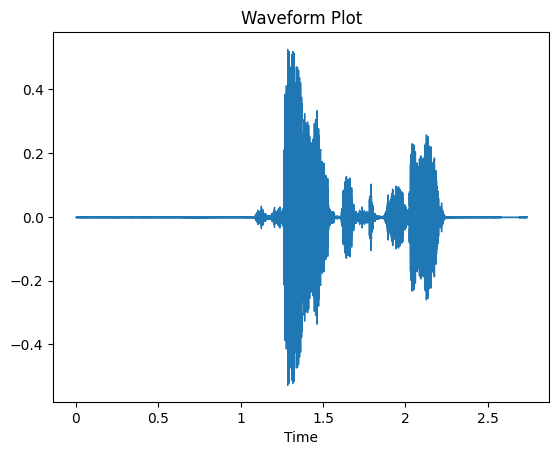

In [15]:
plot_wave_form(sample_file)

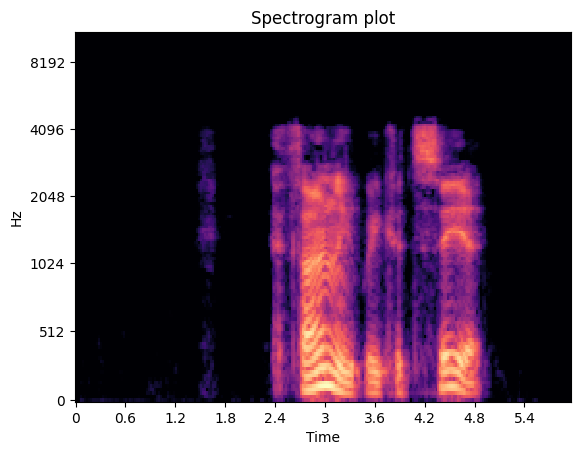

In [16]:
def plot_spectogram(file):
    audio, sr = librosa.load(file, sr = None)
    S = librosa.feature.melspectrogram(y=audio, sr=sr)
    librosa.display.specshow(librosa.power_to_db(S, ref=np.max), y_axis='mel', x_axis='time')
    plt.title('Spectrogram plot')
    
plot_spectogram(sample_file)

# Noise Induction

## Gaussian Noise

Gaussian noise, also known as Gaussian white noise, is a type of random noise that follows a normal, bell-shaped distribution as illustrated below. In this distribution, most noise values are centered around a mean (typically zero), with fewer values appearing as they deviate further from this central point. This predictable pattern of distribution makes Gaussian noise a useful model for simulating real-world, random disturbances in data. Gaussian noise plays an important role in image generation, especially in diffusion-based models, where it helps create realistic and diverse outputs by simulating random pixel variations.

![](https://lh5.googleusercontent.com/proxy/WRTrqiKcQsoncd5UayAclj2UJVtGOKqCNEukz1ZqJK1ME5MTaoPyFtYV_RWH3BAXiH5Rsbnheb030KKNGgFarAWmUyRWMZAfk6zA24LCxA0jJOk)


In this notebook, Gaussian noise will be added to data to simulate noisy environments for the purpose of generating a denoising dataset. Also note, Gaussian noise can be used for data augmentation, by introducing small variations to make machine learning models more robust and resilient to real-world noise.


In [17]:
def add_gaussian_noise(audio, noise_factor):
    # Generate Gaussian noise
    noise = np.random.normal(0, 1, audio.shape)
    # Add the noise to the audio signal
    audio_noisy = audio + noise_factor * noise
    return audio_noisy

In [18]:
audio, sr = librosa.load(sample_file, sr = None)
noisy_data = add_gaussian_noise(audio, 0.02)

output_file = "output_audio_with_gausian_noise.wav"
sf.write(output_file, noisy_data, sr)

In [19]:
print("#### Original Audio")
display(play_audio(sample_file))

print("#### Noisy Add")
display(play_audio(output_file))

#### Original Audio


#### Noisy Add


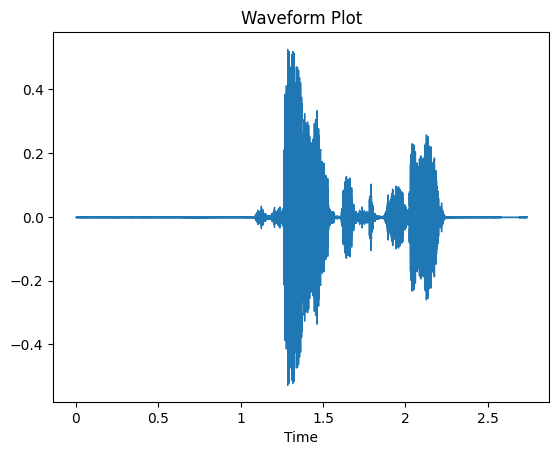

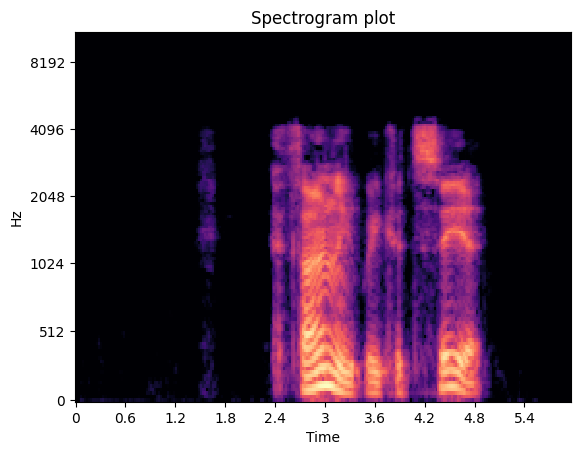

In [20]:
# plot of the original audio sample
plot_wave_form(sample_file)

plot_spectogram(sample_file)

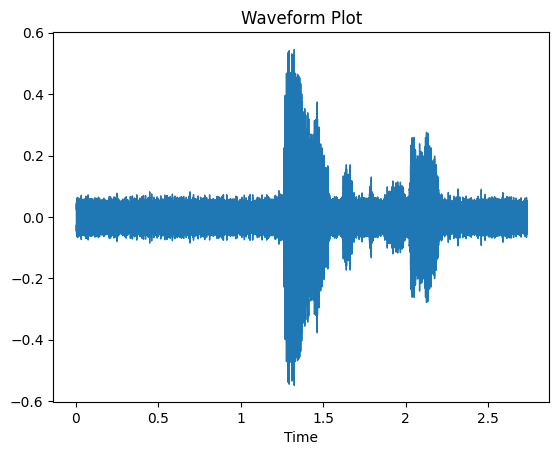

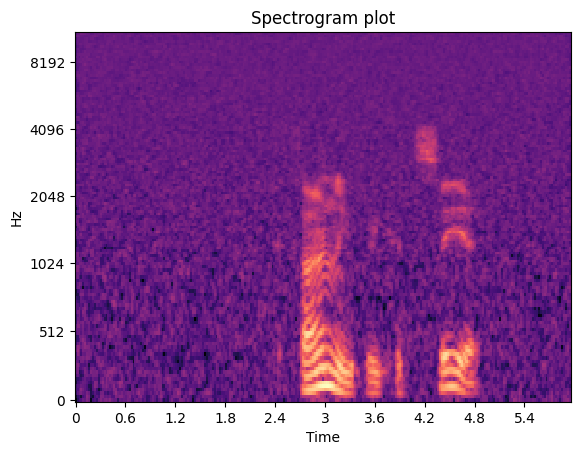

In [21]:
# After Inducing Noise
plot_wave_form(output_file)

plot_spectogram(output_file)

## Audio Applification

This can be used to increase/decrease on the audio intensity. More about it in interference section

In [22]:
def amplify_audio_note(audio, n = 20.5):
    amplified_audio = np.array(audio) * n  # Adjust applicfication level by n

    # Ensure the values stay within the range [-1.0, 1.0] for 32-bit float audio
    amplified_audio = np.clip(amplified_audio, -1.0, 1.0)
    
    return amplified_audio

In [23]:
amplified_audio = amplify_audio_note(audio)

output_file = "output_audio_with_amplified.wav"
sf.write(output_file, amplified_audio, sr)

In [24]:
print("#### Original Audio")
display(play_audio(sample_file))

print("#### Amplified Audio")
display(play_audio(output_file))

#### Original Audio


#### Amplified Audio


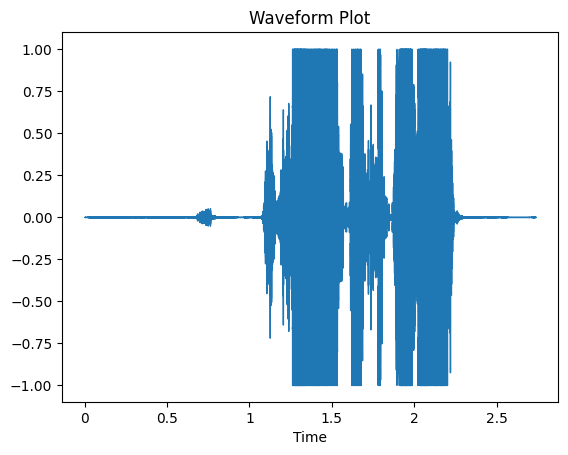

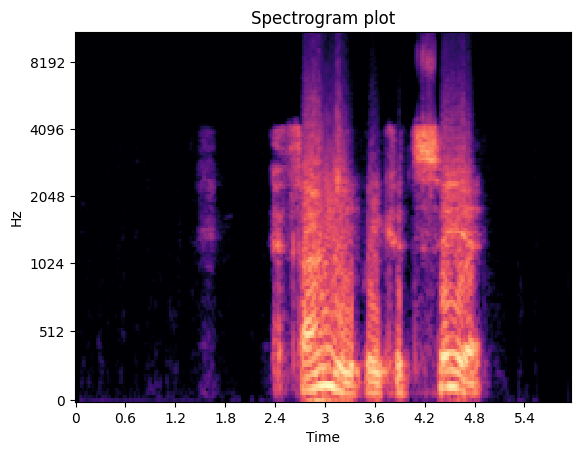

In [25]:
# Plot of the amplified Audio Note
plot_wave_form(output_file)

plot_spectogram(output_file)

## Adding Random Noise Bursts

While Gaussian noise is uniformly distributed, real-world audio disturbances are often more sporadic and unevenly spaced. To simulate this, we introduce random noise bursts, a type of noise known as [impulsive noise](https://cirrusresearch.com/4-different-types-noise/). Impulsive noise consists of high-amplitude bursts that occur unpredictably, creating a more realistic model of sudden, unexpected sounds. By adding these random bursts to the audio, we can better simulate environmental noise conditions that standard Gaussian noise may not capture.

In [26]:
def add_random_bursts(audio, burst_count, burst_duration, burst_amplitude=1.0):
    """
    Adds random noise bursts to an audio signal.
    
    Parameters:
        audio (np.ndarray): The input audio signal.
        burst_count (int): Number of bursts to add to the audio.
        burst_duration (int): Duration of each burst in samples.
        burst_amplitude (float): Amplitude of the noise bursts.
    
    Returns:
        np.ndarray: Audio signal with random bursts added.
    """
    audio_noisy = audio.copy()
    audio_length = len(audio)

    # Generate random bursts
    for _ in range(burst_count):
        # Choose a random start position for each burst
        start_idx = np.random.randint(0, audio_length - burst_duration)
        end_idx = start_idx + burst_duration
        
        # Create the burst noise
        burst_noise = np.random.uniform(-burst_amplitude, burst_amplitude, burst_duration)
        
        # Add the burst noise to the audio
        audio_noisy[start_idx:end_idx] += burst_noise

    return audio_noisy

In [27]:
burst_count = 100                   
burst_duration = int(0.05 * sr)
burst_amplitude = max(audio) * 0.5  

# Add random bursts
audio_with_bursts = add_random_bursts(audio, burst_count, burst_duration, burst_amplitude)

# Save the noisy audio
output_file = "output_audio_with_random_bursts.wav"
sf.write(output_file, audio_with_bursts, sr)

In [28]:
print("#### Original Audio")
display(play_audio(sample_file))

print("#### Noisy Add")
display(play_audio(output_file))

#### Original Audio


#### Noisy Add


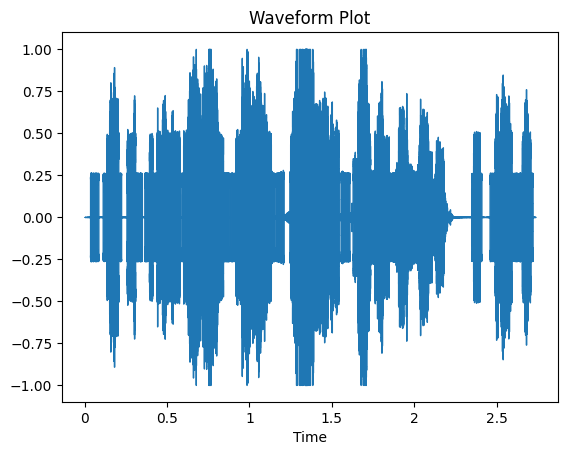

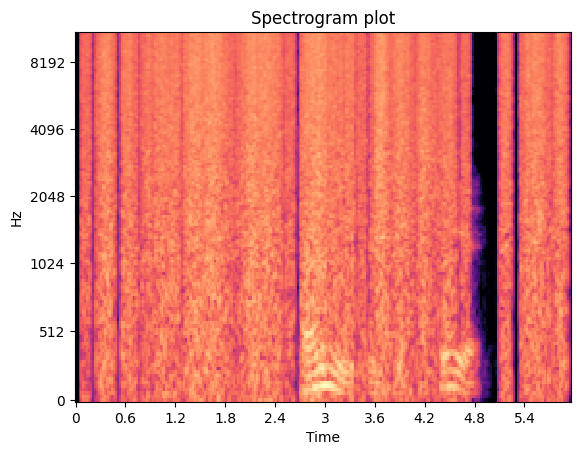

In [29]:
# Generated Audio plot
plot_wave_form(output_file)

plot_spectogram(output_file)

# Generating Noisy Data from Interference

Interference refers to the unwanted addition of external signals that disrupt the clarity and quality of an audio signal. This can come from various sources such as nearby noisy backgorunds, all of which can introduce unintended noise into audio data. Interference is common in real-world settings and often degrades audio quality, making it difficult to isolate or understand the original sound.

<center>
  <img src="https://phys.libretexts.org/@api/deki/files/12012/figure-17-10-04a.jpeg?revision=1&size=bestfit&width=417&height=384" alt="Illustration of Audio Interference">
</center>

To simulate this effect in the data, we generate interference-based noise. By introducing these types of disruptions, we can create noisy data that more closely mirrors real-world conditions, where audio signals are frequently affected by external sources. This helps in training audio processing algorithms to become more robust and accurate, allowing them to perform effectively even when the audio is subject to interference. We will be using a sample-noisy-dataset collected from [Pixa Bay](https://pixabay.com/sound-effects/search/noise/), The noisy data consists of different kind of audio recording including train station, classroom background, noisy caffe e.t.c.

In [30]:
NOISY_DATASET_PATH = Path("/kaggle/input/sample-noisy-data")
ALL_NOISY_DATA = os.listdir(NOISY_DATASET_PATH)
ALL_NOISY_DATA

['brown-noise-by-digitalspa-170337.mp3',
 'door-noise-creak-236022.mp3',
 'classroom-32941.mp3',
 'highway-noise-car-noise-road-noise-highway-noise-car-noise-road-noise-bus-wheels-sound-13639.mp3',
 'bustling-cafe-ambience-27898.mp3',
 'ambient-noise-236388.mp3',
 'classroom-background-54177.mp3',
 'road-transport-noise-233300.mp3',
 'coffee-machine-noise-218424.mp3',
 'train-1-99265.mp3',
 'white-noise-171891.mp3',
 'white-noise-8117.mp3',
 'road-noise-kwun-tong-road-19423.mp3',
 'cafe-noise-32940.mp3',
 'engine-and-road-noise-inside-car-250807.mp3',
 'train-whistle-and-environment-sounds-001-8335.mp3']

In [31]:
# Sample
sample_noisy_file = NOISY_DATASET_PATH / Path(ALL_NOISY_DATA[3])
play_audio(sample_noisy_file)

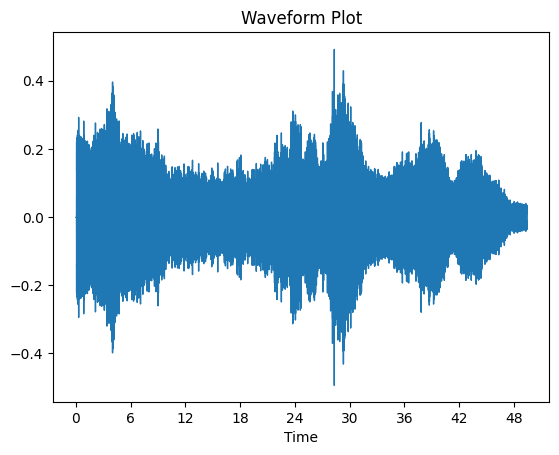

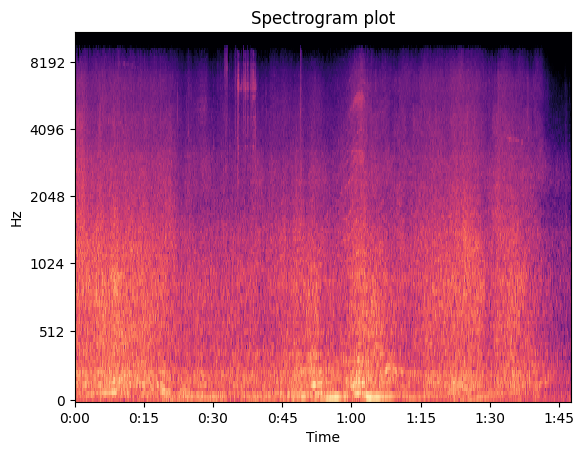

In [32]:
plot_wave_form(sample_noisy_file)

plot_spectogram(sample_noisy_file)

In [33]:
# Sample
sample_noise_file = NOISY_DATASET_PATH / Path(ALL_NOISY_DATA[2])
play_audio(sample_noise_file)

In [34]:
def de_amplify_noise(noise_path):
    audio, sr = librosa.load(noise_path, sr = None)
    audio = amplify_audio_note(audio, 0.45)
    return audio, sr

In [35]:
def audio_interference(audio, audio_sr, noisy_audio_path):
    """
    Adds interference to an audio signal by combining it with a secondary noisy audio signal.
    
    Parameters:
    audio (np.ndarray): The original audio signal as a 1D NumPy array.
    audio_sr (int): Sample rate of the original audio signal.
    noisy_audio_path (str): File path to the noise audio file to be added as interference.
    
    Returns:
    np.ndarray: The combined audio signal with added interference, normalized to prevent clipping.
    """
    
    # First, we lower the amplitude of the noise audio so it doesn’t overwhelm the original audio note
    noisy_audio, noisy_sr = de_amplify_noise(noisy_audio_path)
    
    # Resample the noisy audio if its sample rate is different from the original audio sample rate
    if audio_sr != noisy_sr:
        noisy_audio = librosa.resample(noisy_audio, orig_sr=noisy_sr, target_sr=audio_sr)
    
    # Check if the noisy audio is shorter than the original audio; if so, pad it with zeros
    if len(noisy_audio) < len(audio):
        padding_length = len(audio) - len(noisy_audio)
        padding = np.zeros(padding_length)
        noisy_audio = np.concatenate((noisy_audio, padding))
        
    # Trim the noisy audio if it's longer than the original audio
    noisy_audio = noisy_audio[:len(audio)]
    
    # Combine the signals by adding them
    combined_audio = audio + noisy_audio

    # Normalize the combined signal to prevent clipping
    max_val = np.max(np.abs(combined_audio))
    if max_val != 0:  # Avoid division by zero
        combined_audio = combined_audio / max_val
    
    return combined_audio


In [36]:
sample_file = INPUT_DIR / Path(choice(full_train['filename'].values))
audio, sr = librosa.load(sample_file, sr = None)

combined_audio = audio_interference(audio, sr, sample_noise_file)

In [37]:
play_audio(sample_file)

In [38]:
output_file = "combined_audio.wav"
sf.write(output_file, combined_audio, sr)
play_audio(output_file)

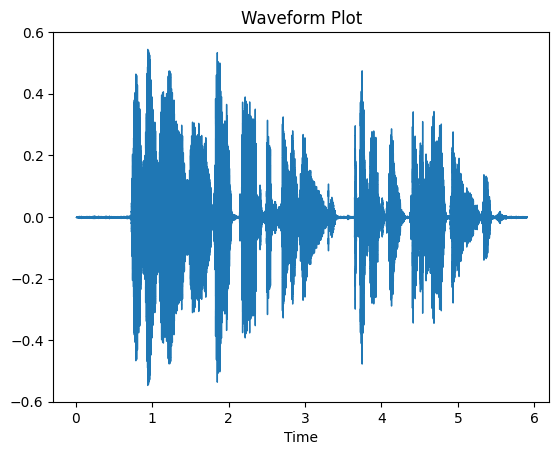

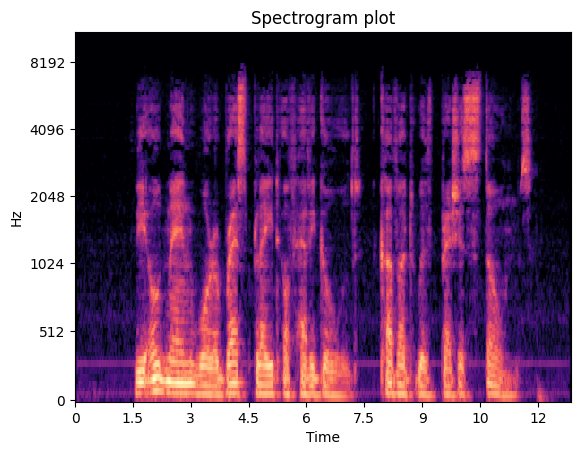

In [39]:
# before combining
plot_wave_form(sample_file)

plot_spectogram(sample_file)

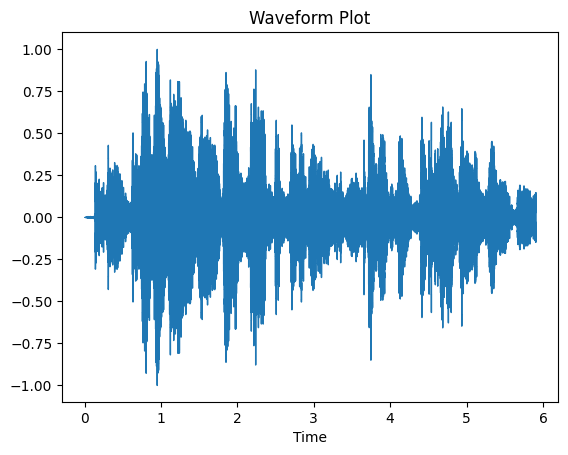

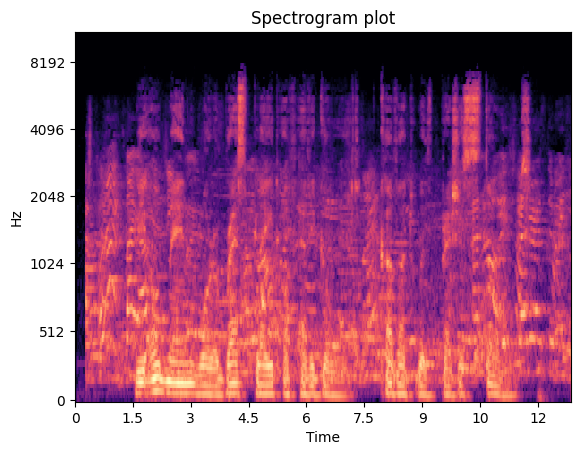

In [40]:
#After combining
plot_wave_form(output_file)

plot_spectogram(output_file)

# Generate Noisy and Clear Dataset

Finally we are to integrate all the above approaches into the dataset to generate a parallel clear and noisy dataset.

In [41]:
from tqdm.auto import tqdm

In [42]:
os.mkdir("Dataset")
os.mkdir("Dataset/Train")
os.mkdir("Dataset/Test")

In [43]:
#
def process_audio_file(file, target_dir, accent):
    file_path = INPUT_DIR / Path(file)
    audio, sr = librosa.load(file_path, sr=None)
    
    results = []
    file_name = file_path.name

    # Copy Original Audio
    original_target_path = f"{target_dir}/original_{file_name}"
    shutil.copy(file_path, original_target_path)
    
    # Add Gaussian Noise
    gaussian_noise = add_gaussian_noise(audio, 0.02)
    output_gaussian_file = f"{target_dir}/gaussian_{file_name}"
    sf.write(output_gaussian_file, gaussian_noise, sr)
    results.append({"original file": original_target_path, "generated noisy audio": output_gaussian_file, "accent": accent})
    
    # Add Random Bursts Noise
    burst_count = 100
    burst_duration = int(0.05 * sr)
    burst_amplitude = max(audio) * 0.5
    audio_with_bursts = add_random_bursts(audio, burst_count, burst_duration, burst_amplitude)
    output_audio_bursts_file = f"{target_dir}/audio_bursts_{file_name}"
    sf.write(output_audio_bursts_file, audio_with_bursts, sr)
    results.append({"original file": original_target_path, "generated noisy audio": output_audio_bursts_file, "accent": accent})
    
    # Add Audio Randmly Interference
    noisy_audio = choice(ALL_NOISY_DATA[:7])
    noisy_data_file = NOISY_DATASET_PATH / Path(noisy_audio)
    combined_audio = audio_interference(audio, sr, noisy_data_file)
    output_audio_interference_file = f"{target_dir}/interference_{noisy_audio}_{file_name}"
    sf.write(output_audio_interference_file, combined_audio, sr)
    results.append({"original file": original_target_path, "generated noisy audio": output_audio_interference_file, "accent": accent})
    
    # Add Another Audio Randmly Interference
    noisy_audio = choice(ALL_NOISY_DATA[7:])
    noisy_data_file = NOISY_DATASET_PATH / Path(noisy_audio)
    combined_audio = audio_interference(audio, sr, noisy_data_file)
    output_audio_interference_file = f"{target_dir}/interference_2_{noisy_audio}_{file_name}"
    sf.write(output_audio_interference_file, combined_audio, sr)
    results.append({"original file": original_target_path, "generated noisy audio": output_audio_interference_file, "accent": accent})
    
    return results


In [44]:
def generate_noisy_dataset(base_df: pd.DataFrame, target_dir: str):
    """
    Generate a noisy dataset by adding different types of noise to audio files.
    Copies the original audio to the target directory and records paths in a DataFrame.
    It uses concurrent process executors to speed up the process

    Parameters:
    - base_df (pd.DataFrame): DataFrame with 'filename' and 'accent' columns.
    - target_dir (str): Directory to save the noisy audio files.

    Returns:
    - pd.DataFrame: DataFrame containing original and generated noisy audio file paths and metadata.
    """
    audio_df = pd.DataFrame(columns=["original file", "generated noisy audio", "accent"])
    
    # Use a ProcessPoolExecutor to process files in parallel
    with concurrent.futures.ProcessPoolExecutor() as executor:
        futures = [executor.submit(process_audio_file, file, target_dir, accent) for file, accent in zip(base_df['filename'].values, base_df['accent'].values)]
        
        for future in tqdm(concurrent.futures.as_completed(futures), total=len(futures)):
            audio_df = pd.concat([audio_df, pd.DataFrame(future.result())], ignore_index=True)
    
    return audio_df


In [45]:
# The dataset isn't properly distributed
full_train['accent'].value_counts()

accent
us                30997
england           14938
indian             4490
australia          4287
canada             3901
scotland           1556
african            1173
newzealand         1153
ireland             944
philippines         326
wales               262
bermuda             196
malaysia            182
singapore           124
hongkong             99
southatlandtic       83
Name: count, dtype: int64

In [46]:
max_samples = 5000  # Maximum samples per class to minimize on the potential biasness

# Perform stratified sampling with the cap
balanced_train_df = full_train.groupby('accent').apply(lambda x: x.sample(n=min(len(x), max_samples), random_state=42))

# Reset index after groupby sampling
balanced_train_df = balanced_train_df.reset_index(drop=True)

/tmp/ipykernel_17/102103434.py:4: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  balanced_train_df = full_train.groupby('accent').apply(lambda x: x.sample(n=min(len(x), max_samples), random_state=42))


In [47]:
balanced_train_df['accent'].value_counts()

accent
england           5000
us                5000
indian            4490
australia         4287
canada            3901
scotland          1556
african           1173
newzealand        1153
ireland            944
philippines        326
wales              262
bermuda            196
malaysia           182
singapore          124
hongkong            99
southatlandtic      83
Name: count, dtype: int64

In [48]:
# new_train_df = generate_noisy_dataset(balanced_train_df, "/kaggle/working/Dataset/Train")

In [49]:
# new_train_df.head()

In [50]:
# new_train_df.shape

In [51]:
# new_test_df = generate_noisy_dataset(full_test, "/kaggle/working/Dataset/Test")

In [52]:
# new_train_df.to_csv("/kaggle/working/Dataset/train.csv")
# new_test_df.to_csv("/kaggle/working/Dataset/test.csv")  

In [53]:
# train_df = pd.read_csv("/kaggle/working/Dataset/train.csv")
# test_df = pd.read_csv("/kaggle/working/Dataset/test.csv")

In [54]:
# train_dataset = Dataset.from_pandas(train_df)
# test_dataset = Dataset.from_pandas(test_df)

In [55]:
# train_dataset = train_dataset.cast_column("original file", Audio())
# train_dataset = train_dataset.cast_column("generated noisy audio", Audio())
# test_dataset = test_dataset.cast_column("original file", Audio())
# test_dataset = test_dataset.cast_column("generated noisy audio", Audio())

In [56]:
# # Combine into DatasetDict
# dataset = DatasetDict({
#     "train": train_dataset,
#     "test": test_dataset
# })

In [57]:
# from huggingface_hub import login
# login()

In [58]:
# repo_name = "rashid0784/common_voice_audio_quality_enhancement_v3"

# # Create the repository if not created yet
# api = HfApi()
# api.create_repo(repo_id=repo_name, repo_type="dataset")

In [59]:
# dataset.push_to_hub(repo_name)

# Conclusion

That is a wrap up, The upcoming notebooks will be mainly centered around exploration of the different ML algorithms that be used to denoise the data. The Generated dataset can be found [here](https://huggingface.co/datasets/rashid0784/common_voice_audio_quality_enhancement_v3).
**P.S Incase you found this Notebook helpful kindly give an upvote ;)**